<a href="https://colab.research.google.com/github/matthewlkey/EEG-LiT/blob/main/EEG-LiT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# EEG-LiT




In [ ]:
#@title Installing Reqirements
!pip install transformers
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu117
!pip install pandas
!pip install numpy
!pip install scipy
!pip install tqdm

Looking in indexes: https://download.pytorch.org/whl/cu117


##How to Run
Select dataset from dropdown below and go to Runtime>Run all

Don't run with less than 50% data. Training step won't work.

In [ ]:
from enum import Enum

class RunType(Enum):
    NORMAL = 1
    CLUSTER = 2
    CLASSIFIER = 3
    VIDEO = 4

class Environment(Enum):
  COLAB = 1
  AZURE = 2


dataset_name = 'Position_task_with_dots_synchronised_min'  # @param [ 'Position_task_with_dots_synchronised_min','Position_task_with_dots_synchronised_max',  'Position_task_with_dots_synchronised_min_hilbert', 'LR_task_with_antisaccade_synchronised_min', 'test' ] {type:"string"}


percent_of_data = 1.00 # @param {type:"slider", min:0.0, max:1.0, step:0.02}

kernel1, kernel2 = [(1,36), (8,1)] # @param [ "[(1,36), (8,1)]", "[(1,16),(4,1)]" ,"[(1,36),(128,1)]" ,"[(1,4),(128,1)]","[(1,16),(128,1)]", "[(1,17), (8,1)]", "[(1,35), (2,1)]", "[(1,35), (1,1)]"] {type:"raw"}

data_shape = [500, 129] # @param ["[500, 129]", "[250,129]", "[500,32]", "[500,16]"]{type:"raw"}

#default =0
l2_regularization = 0  # @param [0, 0.1, 0.01, 0.001] {type:"raw"}
# @markdown ---
#default 15
n_epoch = 15 # @param [15,30,60]{type:"raw"}
#default .0001
learning_rate = 0.0001 # @param [1e-2, 1e-3, 1e-4, 1e-5] {type:"raw"}
#default = 64
batch_size = 64 # @param [8,16,32,64,96, 128] {type:"raw"}
#default = 6
step_size = 6 # @param [6,8,10,20] {type:"raw"}
#default = .1
dropout = 0.1 # @param [0.0, 0.1, 0.2, 0.3, 0.4, 0.5] {type:"raw"}
# @markdown ---
run_type  = RunType.CLUSTER #@param [ 'RunType.NORMAL', 'RunType.CLUSTER' , 'RunType.CLASSIFIER', 'RunType.VIDEO'] {type: "raw"}

environment = Environment.COLAB #@param ['Environment.COLAB', 'Environment.AZURE'] {type:"raw"}

model_name, channels1, channels2, m2 = ['google/vit-base-patch16-224', 256, 768, 768] #@param ["['google/vit-base-patch16-224', 256, 768, 768]", "['google/vit-large-patch16-224', 512, 1024, 1024]",  "['google/vit-base-patch32-384', 256, 768, 768]", "['google/vit-base-patch16-224-in21k', 256, 768, 768]" ]  {type:"raw"}

# @markdown ---
use_augmentation = True  # @param {type:"boolean"}


dataset_name2 = None # @param [ "'LR_task_with_antisaccade_synchronised_min'", "'test'", "None"] {type:"raw"}
percent_of_data2 = 0.3 # @param {type:"slider", min:0.0, max:1.0, step:0.02}


# make_classification = False  # @param {type:"boolean"}
plot_threshold= 55.4 # @param [55.4] {type:"raw"}
remove_outliers = False  # @param {type:"boolean"}
outlier_radius = 50 # @param {type:"raw"}

use_validation_set = True  # @param {type:"boolean"}
convert_to_33hz = False # @param {type:"boolean"}
# @markdown ---
# @markdown In development

reuse_data = False  # @param {type:"boolean"}

run_pca = False  # @param {type:"boolean"}


 #originally false
conv1_bias = False  # @param {type:"boolean"}

num_clusters = 25 if not dataset_name2 else 27


## Download Dataset
Store dataset in Google Drive for persistent storage

In [ ]:
# download data
import os


if environment == Environment.COLAB:
  !pip install torch
  from google.colab import drive
  drive.mount('/content/drive')


file_dir = '/content/drive/MyDrive/EEGViT_DATA/'

if not os.path.exists(f'{file_dir}{dataset_name}.npz'):
  !mkdir {file_dir}

  !wget -P {file_dir} https://files.osf.io/v1/resources/ktv7m/providers/dropbox/prepared/{dataset_name}.npz


dataset2 = f'{file_dir}{dataset_name2}.npz' if dataset_name2 else None
if dataset_name2 and not os.path.exists(dataset2):
  !mkdir {file_dir}

  !wget -P {file_dir} https://files.osf.io/v1/resources/ktv7m/providers/dropbox/prepared/{dataset_name2}.npz



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import random
import numpy as np
import torch
# Set seed for reproducibility
SEED = 2
torch.manual_seed(SEED)
random.seed(SEED)
np.random.seed(SEED)

#Define Model Code Base

Reference of the following cell: [EEGViT](https://github.com/ruiqiRichard/EEGViT)

In [ ]:
import torch
import torch.nn as nn
import transformers
from transformers import ViTFeatureExtractor, ViTForImageClassification
from transformers import ViTModel
from torch.utils.data import Dataset
import torch
import numpy as np
import pandas as pd
from torch.utils.data import DataLoader, Subset
from tqdm import tqdm
from matplotlib import pyplot
from math import floor

class EEGEyeNetDataset(Dataset):
    def __init__(self, data_file, data_file2=None, transpose = True, transform=None):

        #upper 32
        #channels = [22,9, 24, 124, 36, 104, 52, 92, 70, 83, 33, 122, 45, 108, 58, 96, 11, 129, 62, 75, 43, 120, 56, 107, 68, 94, 15, 6, 127, 126, 128, 125]

        #upper 16
        # channels = [15, 129, 75, 24, 52, 128, 43, 45, 56, 68, 124, 92, 120, 108, 107, 94]

        # channels_zero_based = [ch - 1 for ch in channels]

        print('loading data...')
        with np.load(data_file) as f: # Load the data array
            num_elements = int(len(f['EEG']) * percent_of_data)
            self.trainX = f['EEG'][:num_elements]



            self.trainY = pd.DataFrame(f['labels'][:num_elements])
            self.trainY = self.trainY.drop(0, axis=1)


        lrX =np.array([])
        if data_file2:
            with np.load(data_file2) as f: # Load the data array
                num_elements = int(len(f['EEG']) * percent_of_data2)
                lrX = f['EEG'][:num_elements]
                lrY = pd.DataFrame(f['labels'][:num_elements])
                print(lrY.shape)
                lrY = lrY.drop(0, axis=1)

                #lrY.rename(columns={lrY.columns[0]: 0}, inplace=True)
                lrY.loc[:, 1].replace({0: 150, 1: 650}, inplace=True)
                lrY[2] = 300

                #combine Y
                self.trainY = pd.concat([ lrY, self.trainY], axis=0).reset_index(drop=True)

        # Normalize the data
        # mean = self.trainX.mean()
        # std = self.trainX.std()
        # self.trainX = (self.trainX - mean) / (std + 1e-7)  # adding a small value to avoid division by zero

        print(self.trainY)
        if transpose and lrX.size != 0:
            print(lrX.shape)
            print(self.trainX.shape)
            self.trainX = np.transpose(self.trainX, (0,2,1))[:,np.newaxis,:,:]
            lrX = np.transpose(lrX, (0,2,1))[:,np.newaxis,:,:]
            print(lrX.shape)
            print(self.trainX.shape)

            self.trainX = np.concatenate( (lrX,self.trainX) , axis=0)
        elif transpose:
            self.trainX = np.transpose(self.trainX, (0,2,1))[:,np.newaxis,:,:]


        # self.trainX = self.trainX[:, :, channels_zero_based, :]

        #take a peice from the center
        #self.trainX = self.trainX[:, :, :, 250:]

        self.transform=transform

    def __getitem__(self, index):
        # Read a single sample of data from the data array
        X = torch.from_numpy(self.trainX[index]).float()
        y = torch.from_numpy(self.trainY.loc[index][0:2].values).float()
        # Return the tensor data
        if self.transform:
          X = self.transform(X)

        return (X,y,index)

    def __len__(self):
        # Compute the number of samples in the data array
        return len(self.trainX)

class EEGViT_classifier(nn.Module):
    def __init__(self, dropout = 0.1, conv1_bias = False, channels1=64, channels2=768,m2=768, model_name="google/vit-base-patch16-224", kernel1=(1,35), kernel2=(8,1)):
        super().__init__()
        self.conv1 = nn.Conv2d(
            in_channels=1,
            out_channels=channels1,
            kernel_size=kernel1,
            stride=kernel1,
            padding=(0,0),
            bias=conv1_bias
        )

        self.batchnorm1 = nn.BatchNorm2d(channels1, eps=1e-12)
        # self.batchnorm1 = nn.BatchNorm2d(256, False)
        img_size = (round(500/kernel1[1]), round(129/kernel2[0]))

        config = transformers.ViTConfig.from_pretrained(model_name)
        config.update({'num_channels': channels1})
        config.update({'image_size': (129, img_size[0] )})
        config.update({'patch_size': (kernel2) })

        model = transformers.ViTForImageClassification.from_pretrained(model_name, config=config, ignore_mismatched_sizes=True)
        model.vit.embeddings.patch_embeddings.projection = torch.nn.Conv2d(channels1, channels2, kernel_size=kernel2, stride=kernel2, padding=(0,0), groups=channels1)
        model.classifier=torch.nn.Sequential(torch.nn.Linear(m2,1000,bias=True),
                                     torch.nn.Dropout(p=dropout),
                                     torch.nn.Linear(1000,num_clusters,bias=True))

        self.ViT = model

    def forward(self,x):
        x = self.conv1(x)
        # print("After conv1:", x.shape)
        x = self.batchnorm1(x)
        # print("After batchnorm1:", x.shape)
        x = self.ViT.forward(x).logits
        # print("After ViT:", x.shape)
        return x

import torch.nn.functional as F

class DeeperEEGViT_pretrained(nn.Module):
    def __init__(self, dropout=0.1, conv1_bias=False, channels1=64, channels2=768, m2=768, model_name="google/vit-base-patch16-224", kernel1=(1,35), kernel2=(1,1)):
        super().__init__()

        # Initial Convolution
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=channels1, kernel_size=kernel1, stride=kernel1, padding=(0,0), bias=conv1_bias)
        self.batchnorm1 = nn.BatchNorm2d(channels1, eps=1e-12)

        # Additional Convolutional Layers
        self.conv2 = nn.Conv2d(in_channels=channels1, out_channels=channels1, kernel_size=kernel2, stride=1, padding=(0,0))
        self.batchnorm2 = nn.BatchNorm2d(channels1, eps=1e-12)

        config = transformers.ViTConfig.from_pretrained(model_name)
        config.update({'num_channels': channels1})
        config.update({'image_size': (129, 14)})
        config.update({'patch_size': (8,1)})

        model = transformers.ViTForImageClassification.from_pretrained(model_name, config=config, ignore_mismatched_sizes=True)
        model.vit.embeddings.patch_embeddings.projection = torch.nn.Conv2d(channels1, channels2, kernel_size=(8,1), stride=(8,1), padding=(0,0), groups=channels1)

        # Adding more layers to classifier
        model.classifier = nn.Sequential(
            nn.Linear(m2, 1500),
            nn.ReLU(),
            nn.Dropout(p=dropout),
            nn.Linear(1500, 1000),
            nn.ReLU(),
            nn.Dropout(p=dropout),
            nn.Linear(1000, 2)
        )

        self.ViT = model

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.batchnorm1(x)
        x = F.relu(self.conv2(x))
        x = self.batchnorm2(x)
        x = self.ViT(x).logits
        return x

class EEGViT_pretrained_single(nn.Module):
    def __init__(self,dropout = 0.1, model_name="google/vit-base-patch16-224"):
        super().__init__()

        # self.channel_expander = nn.Conv2d(in_channels=1, out_channels=256, kernel_size=1, stride=1, padding=0)

        self.batchnorm1 = nn.BatchNorm2d(1, eps=1e-12)

        kernel=(8,31)

        config = transformers.ViTConfig.from_pretrained(model_name)
        config.update({'num_channels': 1})
        config.update({'image_size': (129,500) })
        config.update({'patch_size': (16,16) })

        model = transformers.ViTForImageClassification.from_pretrained(model_name, config=config, ignore_mismatched_sizes=True)
        model.vit.embeddings.patch_embeddings.projection = torch.nn.Conv2d(1, 768, kernel_size=(16,16), stride=(16,16), padding=(0,0), groups=1)
        model.classifier=torch.nn.Sequential(torch.nn.Linear(m2,1000,bias=True),
                                     torch.nn.Dropout(p=dropout),
                                     torch.nn.Linear(1000,2,bias=True))

        self.ViT = model

    def forward(self,x):

        # x=self.channel_expander(x)
        x=self.batchnorm1(x)
        x=self.ViT.forward(x).logits

        return x

class EEGViT_pretrained(nn.Module):
    def __init__(self,dropout = 0.1,  conv1_bias = False, channels1=256, channels2=768,m2=768, model_name="google/vit-base-patch16-224", kernel1=(1,35), kernel2=(8,1)):
        super().__init__()
        self.conv1 = nn.Conv2d(
            in_channels=1,
            out_channels=channels1,
            kernel_size=kernel1,
            stride=kernel1,
            padding=(0,0),
            bias=conv1_bias
        )

        self.batchnorm1 = nn.BatchNorm2d(channels1, eps=1e-12)
        # self.batchnorm1 = nn.BatchNorm2d(256, False)
        img_size = (floor(data_shape[0]/kernel1[1]), floor(data_shape[1]/kernel2[0]))

        config = transformers.ViTConfig.from_pretrained(model_name)
        config.update({'num_channels': channels1})
        config.update({'image_size': (data_shape[1], img_size[0] ) })
        config.update({'patch_size': (kernel2) })

        model = transformers.ViTForImageClassification.from_pretrained(model_name, config=config, ignore_mismatched_sizes=True)
        model.vit.embeddings.patch_embeddings.projection = torch.nn.Conv2d(channels1, channels2, kernel_size=kernel2, stride=kernel2, padding=(0,0), groups=channels1)
        model.classifier=torch.nn.Sequential(torch.nn.Linear(m2,1000,bias=True),
                                     torch.nn.Dropout(p=dropout),
                                     torch.nn.Linear(1000,2,bias=True))

        # model.classifier = torch.nn.Sequential(
        #     torch.nn.Linear(768, 2, bias=True)  # Output 2 values (x and y)
        # )

        self.ViT = model

    def forward(self,x):
        x=self.conv1(x)
        x=self.batchnorm1(x)
        x=self.ViT.forward(x).logits

        # Scale the output
        # x[:, 0] = -100 + torch.sigmoid(x[:, 0]) * 1000  # scale between -100 and 900
        # x[:, 1] = -100 + torch.sigmoid(x[:, 1]) * 800  # scale between -100 and 700


        return x

class EEGViT_raw(nn.Module):
    def __init__(self, ViTLayers):
        super().__init__()
        self.conv1 = nn.Conv2d(
            in_channels=1,
            out_channels=256,
            kernel_size=(1, 36),
            stride=(1, 36),
            padding=(0,2),
            bias=False
        )
        self.batchnorm1 = nn.BatchNorm2d(256, False)
        config = transformers.ViTConfig(
            hidden_size=768,
            num_hidden_layers=12,
            num_attention_heads=12,
            intermediate_size=3072,
            hidden_dropout_prob=0.1,
            attention_probs_dropout_prob=0.1,
            initializer_range=0.02,
            num_channels=256,
            image_size=(129,14),
            patch_size=(8,1)
        )
        model = ViTModel(config)
        model.embeddings.patch_embeddings.projection = torch.nn.Conv2d(256, 768, kernel_size=(8, 1), stride=(8, 1), padding=(0,0), groups=256)
        model.pooler.activation = torch.nn.Sequential(torch.nn.Dropout(p=0.1),
                                                       torch.nn.Linear(768,2,bias=True))
        self.ViT = model

    def forward(self,x):
        x=self.conv1(x)
        x=self.batchnorm1(x)
        x=self.ViT(x).pooler_output

        return x

class ViTBase_PT(nn.Module):
    def __init__(self):
        super().__init__()
        model_name = "google/vit-base-patch16-224"
        config = transformers.ViTConfig.from_pretrained(model_name)
        config.update({'num_channels': 1})
        config.update({'image_size': (129,500)})
        config.update({'patch_size': (8,35)})

        model = transformers.ViTForImageClassification.from_pretrained(model_name, config=config, ignore_mismatched_sizes=True)

        model.vit.embeddings.patch_embeddings.projection = nn.Sequential(torch.nn.Conv2d(1, 768, kernel_size=(8, 36), stride=(8, 36), padding=(0,2)), nn.BatchNorm2d(768))

        model.classifier=torch.nn.Sequential(torch.nn.Linear(768,1000,bias=True), torch.nn.Dropout(p=0.1), torch.nn.Linear(1000,2,bias=True))
        self.ViT = model

    def forward(self,x):
        x=self.ViT(x).logits
        return x

class ViTBase(nn.Module):
    def __init__(self):
        super().__init__()
        config = transformers.ViTConfig(
            hidden_size=768,
            num_hidden_layers=12,
            num_attention_heads=12,
            intermediate_size=3072,
            hidden_dropout_prob=0.1,
            attention_probs_dropout_prob=0.1,
            initializer_range=0.02,
            num_channels=1,
            image_size=(129,500),
            patch_size=(8,35)
        )
        model = ViTModel(config)
        model.embeddings.patch_embeddings.projection = torch.nn.Conv2d(1, 768, kernel_size=(8, 36), stride=(8, 36), padding=(0,2))
        model.pooler.activation = torch.nn.Sequential(torch.nn.Dropout(p=0.1), torch.nn.Linear(768,2,bias=True))

        self.model = model
    def forward(self,x):
        x=self.model(x).pooler_output
        return x


## Load Base Model and Data into Memory

In [ ]:
from torchvision import transforms
import os

def load(file):
  if reuse_data and os.path.exists(file):
    return torch.load(file)
  return None

def save(data, file):
  if reuse_data and not os.path.exists(file):
    torch.save(data, file)

EEGEyeNet = load(f"{file_dir}{dataset_name}.pth") or EEGEyeNetDataset(f'{file_dir}{dataset_name}.npz', data_file2= dataset2)
save(EEGEyeNet,  f"{file_dir}{dataset_name}.pth")

if use_augmentation:
  EEGEyeNet_Flipped = load(f"{file_dir}{dataset_name}-flipped.pth") or EEGEyeNetDataset(f'{file_dir}{dataset_name}.npz', transform=transforms.functional.hflip, data_file2= dataset2)
  save(EEGEyeNet_Flipped, f"{file_dir}{dataset_name}-flipped.pth")





loading data...
           1      2
0      408.1  315.1
1      640.7  519.1
2      404.2  118.8
3      123.9  467.1
4      711.7  460.0
...      ...    ...
21459  725.1  156.6
21460  521.4  202.8
21461  115.5  306.1
21462  732.0  310.3
21463  632.2  353.6

[21464 rows x 2 columns]
loading data...
           1      2
0      408.1  315.1
1      640.7  519.1
2      404.2  118.8
3      123.9  467.1
4      711.7  460.0
...      ...    ...
21459  725.1  156.6
21460  521.4  202.8
21461  115.5  306.1
21462  732.0  310.3
21463  632.2  353.6

[21464 rows x 2 columns]


In [ ]:
EEGEyeNet.trainX[0][0].shape

(129, 500)

In [ ]:
EEGEyeNet.trainX.shape

(21464, 1, 129, 500)

In [ ]:
EEGEyeNet.trainY

,1,2
0,408.1,315.1
1,640.7,519.1
2,404.2,118.8
3,123.9,467.1
4,711.7,460.0
...,...,...
21459,725.1,156.6
21460,521.4,202.8
21461,115.5,306.1
21462,732.0,310.3


##Visualize Data

In [ ]:

if environment == Environment.COLAB:
  from google.colab import data_table
  data_table.enable_dataframe_formatter()
  from google.colab import autoviz


In [ ]:
from matplotlib import pyplot as plt

def scatter_plots(df, colname_pairs, figscale=2, alpha=.8):

  plt.figure(figsize=(12, 8))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(2*figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
    ax.grid(True)
  plt.tight_layout()
  plt.xlim(0,800)
  plt.ylim(0,600)
  #plt.xticks(range(0,800,20), rotation=90)
  #plt.yticks(range(0,600, 20))
  #plt.tick_params(axis='both', labelsize=8)

  #plt.savefig("labels.png")
  return autoviz.MplChart.from_current_mpl_state()

if environment == Environment.COLAB:
  chart = scatter_plots(EEGEyeNet.trainY, *[[[1, 2]]], **{})

  chart


#Preprocess data

## Generate Synthetic Data


In [ ]:
import torch
import torch.nn as nn

# Define the Generator
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(100, 256),  # 100 is the size of the random noise input
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 129*500),  # Flattened shape of EEGEyeNet.trainX
            nn.Tanh()
        )

    def forward(self, z):
        return self.model(z).view(-1, 1, 129, 500)

# Define the Discriminator
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(129*500, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x_flat = x.view(x.size(0), -1)
        return self.model(x_flat)

##Window smooth data to 33hz

In [ ]:
windowsize = 15

def process_dataset(dataset):
    # Assuming dataset shape is (21464, 1, 129, 500)
    processed_data = np.zeros_like(dataset)  # To store processed data

    for i in range(dataset.shape[0]):
        d = pd.DataFrame(dataset[i][0])  # Transpose the DataFrame to (500, 129)
        # rolled_d = d.apply(lambda row: row.rolling(window=windowsize, center=False).mean(), axis=1)

        rolled_d = d.rolling(window=windowsize, axis=1, center=True).mean()
        rolled_d = rolled_d.fillna(method='bfill', axis=1).fillna(method='ffill', axis=1)

        # Convert rolled_d back to numpy and store in processed_data
        processed_data[i][0] = rolled_d.to_numpy()

    return processed_data

if convert_to_33hz:
  # Assuming EEGEyeNet.trainX is a numpy array with shape (21464, 1, 129, 500)
  EEGEyeNet.trainX = process_dataset(EEGEyeNet.trainX)

##Perform PCA


In [ ]:
if run_pca:

  from sklearn.decomposition import PCA

  from sklearn.preprocessing import StandardScaler

  scaler= StandardScaler()

  a,b,c,d = EEGEyeNet.trainX.shape

  # Flatten dimensions
  flattened_array = EEGEyeNet.trainX.reshape(a,c*d)

  X_scaled = scaler.fit_transform(flattened_array)
  cleaned = X_scaled[EEGEyeNet.trainY.index]

  pca = PCA(.95)

  X_pca = pca.fit_transform(cleaned)

  X_pca.shape



##Remove Outliers

In [ ]:

#remove rows with negative values
import pandas as pd
if remove_outliers:
  df = EEGEyeNet.trainY

  df = df[(df >= 0).all(axis=1)]
  df

In [ ]:
from sklearn.cluster import KMeans
import numpy as np
import matplotlib.pyplot as plt

if remove_outliers:

  kmeans = KMeans(n_clusters=num_clusters, random_state = SEED)
  kmeans.fit(df.iloc[:,0:2])
  centroids = kmeans.cluster_centers_

  centroids
  df.values

  plt.figure(figsize=(8, 6))  # Width x Height in inches

  plt.xlim(0,800)
  plt.ylim(0,600)
  plt.scatter(df[1], df[2], c=kmeans.labels_, cmap='viridis', s=3)
  plt.scatter(centroids[:, 0], centroids[:, 1], c='red', marker='x', s=10*8, label='Centroids')
  plt.legend()
  plt.title('K-Means Clustering with Centroids')
  plt.show()

In [ ]:
if remove_outliers:
  centroids

In [ ]:


def is_inside_radius(row):
  # Create a column to store the result for each circle
  radius = outlier_radius
  for i, circle in enumerate(centroids):
      center_x, center_y = circle
      distance = np.sqrt((row[1] - center_x)**2 + (row[2] - center_y)**2)
      inside_radius = distance <= radius
      if inside_radius:
        return True
  return False

if remove_outliers:
  filtered_df = df[df.apply(lambda row: is_inside_radius(row), axis=1)]




In [ ]:
if remove_outliers:
  kmeans = KMeans(n_clusters=num_clusters, random_state = SEED)
  kmeans.fit(filtered_df.iloc[:,0:2])
  centroids = kmeans.cluster_centers_

  plt.figure(figsize=(8, 6))  # Width x Height in inches

  plt.xlim(0,800)
  plt.ylim(0,600)
  plt.scatter(filtered_df[1], filtered_df[2], c=kmeans.labels_, cmap='viridis', s=3)
  plt.scatter(centroids[:, 0], centroids[:, 1], c='red', marker='x', s=10*8, label='Centroids')
  plt.legend()
  plt.title('K-Means Clustering with Centroids')
  plt.show()

In [ ]:
if remove_outliers:
  EEGEyeNet.trainY = filtered_df

#Make into Clustering Problem


In [ ]:
from torch.nn.modules.module import register_module_module_registration_hook
from sklearn.cluster import KMeans
import numpy as np
import matplotlib.pyplot as plt


if run_type in [RunType.CLUSTER, RunType.VIDEO]:

  df = EEGEyeNet.trainY

  df = df[(df >= 0).all(axis=1)]

  kmeans = KMeans(n_clusters=num_clusters, random_state = SEED)
  kmeans.fit(df.iloc[:,0:2])
  centroids = kmeans.cluster_centers_

  predictions = pd.DataFrame(kmeans.predict(df.iloc[:,0:2]), index = df.index)

  centers = pd.DataFrame(centroids[predictions.iloc[:,0]], index = predictions.index)

  # center_points = df.apply(lambda row: predict_row(row), axis=1)

  # df_w_centroids = center_points.apply(lambda row: centroids[row[0]] )
  EEGEyeNet.trainY = centers




/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


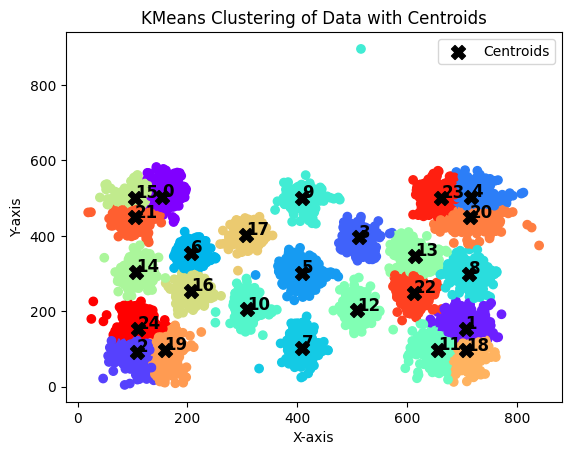

In [ ]:
if run_type in [RunType.CLUSTER, RunType.VIDEO]:
  # Plotting the data points and centroids
  plt.scatter(df.iloc[:, 0], df.iloc[:, 1], c=predictions.iloc[:, 0], cmap='rainbow')
  plt.scatter(centroids[:, 0], centroids[:, 1], marker='X', s=100, c='black', label='Centroids')

  # Annotating the centroids with predicted labels
  for i, centroid in enumerate(centroids):
      plt.annotate(str(i), (centroid[0], centroid[1]), fontsize=12, fontweight='bold')

  plt.title("KMeans Clustering of Data with Centroids")
  plt.xlabel("X-axis")
  plt.ylabel("Y-axis")
  plt.legend()
  plt.show()

<ipython-input-29-f6fd6476d8dc>:8: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(EEGEyeNet.trainY[0], EEGEyeNet.trainY[1], cmap='viridis', s=3)


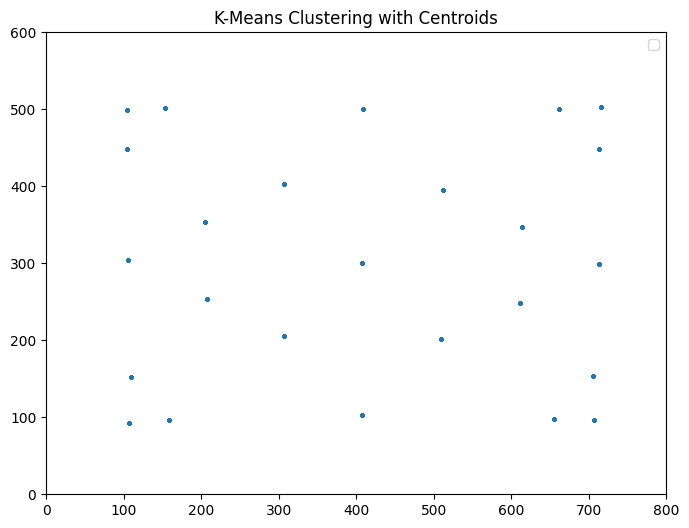

In [ ]:
if run_type==RunType.CLUSTER:
  EEGEyeNet.trainY = EEGEyeNet.trainY.astype(int)

  plt.figure(figsize=(8, 6))  # Width x Height in inches

  plt.xlim(0,800)
  plt.ylim(0,600)
  plt.scatter(EEGEyeNet.trainY[0], EEGEyeNet.trainY[1], cmap='viridis', s=3)
  plt.legend()
  plt.title('K-Means Clustering with Centroids')
  plt.show()

In [ ]:
EEGEyeNet.trainY

,0,1
0,408,301
1,662,501
2,408,103
3,104,449
4,714,449
...,...,...
21459,706,154
21460,509,202
21461,106,304
21462,713,299


#Make into Classification Problem

In [ ]:
from torch.nn.modules.module import register_module_module_registration_hook
from sklearn.cluster import KMeans
import numpy as np
import matplotlib.pyplot as plt


if run_type==RunType.CLASSIFIER:

  df = EEGEyeNet.trainY

  df = df[(df >= 0).all(axis=1)]

  kmeans = KMeans(n_clusters=num_clusters, random_state = SEED)
  kmeans.fit(df.iloc[:,0:2])
  centroids = kmeans.cluster_centers_

  predictions = pd.DataFrame(kmeans.predict(df.iloc[:,0:2]), index = df.index)

  centers = pd.DataFrame(centroids[predictions.iloc[:,0]], index = predictions.index)

  #center_points = df.apply(lambda row: predict_row(row), axis=1)

  # df_w_centroids = center_points.apply(lambda row: centroids[row[0]] )
  EEGEyeNet.trainY = predictions


In [ ]:
if run_type in [RunType.CLASSIFIER]:
  # Plotting the data points and centroids
  # plt.scatter(df.iloc[:, 0], df.iloc[:, 1], c=predictions.iloc[:, 0], cmap='rainbow')
  plt.scatter(centroids[:, 0], centroids[:, 1], marker='X', s=100, c='black', label='Centroids')

  # Annotating the centroids with predicted labels
  for i, centroid in enumerate(centroids):
      plt.annotate(str(i), (centroid[0], centroid[1]), fontsize=12, fontweight='bold')

  plt.title("KMeans Clustering of Data with Centroids")
  plt.xlabel("X-axis")
  plt.ylabel("Y-axis")
  plt.legend()
  plt.show()

#Make Video

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import matplotlib

def animate(i):
    ax.clear()
    data = eeg_data_list[i][0]  # Access the data for the current frame and remove the channel dimension
    label = labels[sorted_indices[i]]
    original_index = sorted_indices[i]  # Observation number (before sorting)

    offset = 5  # Adjust based on amplitude range of your data
    for ch in range(data.shape[0]):  # Loop over channels

        ax.plot(data[ch] + ch * offset)  # Plot EEG data for current channel with offset
    if i % 100 == 0:
      print(f"EEG Frame {i}")
    ax.set_title(f"EEG Frame {i}, Label: {label}, Observation: {original_index}")
    ax.set_xlabel('Time Points')
    ax.set_ylabel('Amplitude (with offset)')

if run_type== RunType.VIDEO:
  matplotlib.rcParams['animation.embed_limit'] = 2**128  # large value

  # Replace this with loading your actual EEG data
  eeg_data_list = EEGEyeNet.trainX
  labels = EEGEyeNet.trainY.to_numpy().flatten()

  sorted_indices = np.argsort(labels)
  eeg_data_list = eeg_data_list[sorted_indices]

  fig, ax = plt.subplots(figsize=(15, 10))

  ani = animation.FuncAnimation(fig, animate, frames=len(eeg_data_list), repeat=False)

  # You may need to have ffmpeg installed to save as mp4
  ani.save('eeg_animation2.mp4', writer='ffmpeg', fps=2)


#Train Model

In [ ]:

match run_type:
  case RunType.CLASSIFIER:
    model = EEGViT_classifier( )
  case _:
    # model=DeeperEEGViT_pretrained()
    model = EEGViT_pretrained(dropout, conv1_bias, channels1, channels2, m2, model_name, kernel1, kernel2)
    #model = EEGViT_pretrained_single(dropout, model_name)


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized because the shapes did not match:
- vit.embeddings.patch_embeddings.projection.weight: found shape torch.Size([768, 3, 16, 16]) in the checkpoint and torch.Size([768, 256, 8, 1]) in the model instantiated
- vit.embeddings.position_embeddings: found shape torch.Size([1, 197, 768]) in the checkpoint and torch.Size([1, 209, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:

optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, weight_decay=l2_regularization)

scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=step_size, gamma=0.1)
# scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[2], gamma=.1)
# scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=10, verbose=True)



Reference of the following cell: [EEGViT](https://github.com/ruiqiRichard/EEGViT)

In [ ]:
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, Subset, ConcatDataset, DataLoader

import matplotlib.pyplot as plt
from math import sqrt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import classification_report


target_size = 4 if not run_type==RunType.CLUSTER else 8


def plot_coordinates_with_threshold(data, threshold):
    count =0
    plt.figure(figsize=(20, 14))

    for a,b,x,y, rmse in data:
        line_color = 'g' if rmse <= threshold else 'r'
        if rmse <= threshold:
            #count
            plt.plot(x, y,  'bo',markersize=4)
        else:
            plt.plot(x, y, 'rx', markersize=4 )
            count+=1

        # Plot a line between (a,b) and (x,y) with the specified color and opacity
        plt.plot([a, x], [b, y], line_color + '-', alpha=0.02)
        plt.plot(a, b,  'bo',markersize=target_size, alpha=0.05)


    plt.xlim(0,800)
    plt.ylim(0,600)
    plt.xlabel("X Coordinate")
    plt.ylabel("Y Coordinate")
    plt.title("Coordinates Categorized by RMSE")
    print(count)
    plt.show()

def split(data):
    # Calculate the split points

    if use_validation_set:
      split1 = len(data)-3481-3277
    else:
      split1 = len(data)-3481

    split2 = len(data)-3481

    # Split the data into three parts
    train = data[:split1]
    val = data[split1:split2]
    test = data[split2:]

    return train, val, test

def train(model, optimizer, scheduler = None):
    '''
      model: model to train
      optimizer: optimizer to update weights
      scheduler: scheduling learning rate, used when finetuning pretrained models
    '''
    torch.cuda.empty_cache()

    train_indices, val_indices, test_indices = split(EEGEyeNet.trainY.index)

    print(f'train: {len(train_indices)}, val: {len(val_indices)} test: {len(test_indices)}')

    print('create dataloader...')
    train = Subset(EEGEyeNet,indices=train_indices)
    val = Subset(EEGEyeNet,indices=val_indices)
    test = Subset(EEGEyeNet,indices=test_indices)

    if use_augmentation:
      flipped_train = Subset(EEGEyeNet_Flipped,indices=train_indices)
      augmented_train = ConcatDataset([train, flipped_train])
      train_loader = DataLoader(augmented_train, batch_size=batch_size, shuffle=True)
    else:
      train_loader = DataLoader(train, batch_size=batch_size, shuffle=True)

    val_loader = DataLoader(val, batch_size=batch_size)
    test_loader = DataLoader(test, batch_size=1)


    print("HI")

    if torch.cuda.is_available():
      gpu_id = 0  # Change this to the desired GPU ID if you have multiple GPUs
      torch.cuda.set_device(gpu_id)
      device = torch.device(f"cuda:{gpu_id}")
    else:
      device = torch.device("cpu")

    if torch.cuda.device_count() > 1:
      model = nn.DataParallel(model)  # Wrap the model with DataParallel

    model = model.to(device)

    match run_type:
      case RunType.CLASSIFIER:
        criterion = nn.CrossEntropyLoss()
      case _:
        criterion = nn.MSELoss()

    criterion = criterion.to(device)

    # Initialize lists to store losses
    train_losses = []
    val_losses = []
    test_losses = []

    print('training...')
    # Train the model


    for epoch in range(n_epoch):
      model.train()
      epoch_train_loss = 0.0

      true_labels = []
      predicted_labels = []
      output_and_rmse = []
      i=0

      # print(tqdm(enumerate(train_loader)))
      for value in train_loader:

        inputs, targets, index = value

        # Move the inputs and targets to the GPU (if available)
        inputs = inputs.to(device)
        targets = targets.to(device)

        # Compute the outputs and loss for the current batch
        optimizer.zero_grad()
        outputs = model(inputs)

        loss = criterion(outputs.squeeze(), targets.squeeze())

        # Compute the gradients and update the parameters
        loss.backward()
        optimizer.step()
        epoch_train_loss += loss.item()

        # Print the loss and accuracy for the current batch
        if i % 100 == 0:
            print(f"Epoch {epoch}, batch {i} train Loss: {loss.item()}")

        i+=1

      epoch_train_loss /= len(train_loader)
      train_losses.append(epoch_train_loss)

      # Evaluate the model on the validation set
      model.eval()


      if len(val_indices)>0:
        with torch.no_grad():
          val_loss = 0.0
          for inputs, targets, index in val_loader:
            # Move the inputs and targets to the GPU (if available)
            inputs = inputs.to(device)
            targets = targets.to(device)
            # Compute the outputs and loss for the current batch
            outputs = model(inputs)
            # print(outputs)
            loss = criterion(outputs.squeeze(), targets.squeeze())
            val_loss += loss.item()

          val_loss /= len(val_loader)

          val_losses.append(val_loss)

          if val_loss == min(val_losses):
            print(f"Epoch {epoch}, Val Loss: {val_loss} (best so far, saving..)")
            torch.save(model.state_dict(), f'/content/drive/MyDrive/EEGViT_DATA/EEGLiT-best.pt')




          print(f"Epoch {epoch}, Val Loss: {val_loss}")
        print(f"best validation loss: {min(val_losses)}")

      if len(test_indices)>0:
        with torch.no_grad():
          val_loss = 0.0

          for inputs, targets, index in test_loader:
            # Move the inputs and targets to the GPU (if available)


            inputs = inputs.to(device)
            targets = targets.to(device)
            # Compute the outputs and loss for the current batch
            outputs = model(inputs)
            loss = criterion(outputs.squeeze(), targets.squeeze())
            val_loss += loss.item()

            #classifier
            if run_type == RunType.CLASSIFIER:
              _, preds = torch.max(outputs, 1)
              true_labels.extend(targets.cpu().numpy())
              predicted_labels.extend(preds.cpu().numpy())

            if  run_type in [RunType.NORMAL, RunType.CLUSTER]:
              x,y = outputs.tolist()[0]
              a,b = targets.tolist()[0]

              output_and_rmse.append([a,b,x,y, sqrt(loss.item())])


          val_loss /= len(test_loader)
          test_losses.append(val_loss)
          print(f"Epoch {epoch}, test Loss: {val_loss}")

        print(f"best test loss: {min(test_losses)}")

      if scheduler is not None:
        scheduler.step()

      pyplot.plot(train_losses, label = "Training Loss")
      pyplot.plot(val_losses, label= "Validation Loss")
      pyplot.plot(test_losses, label = "Test Loss")
      pyplot.legend()
      pyplot.show()

      if  run_type in [RunType.NORMAL, RunType.CLUSTER]:
        plot_coordinates_with_threshold(output_and_rmse, plot_threshold)

      #classifier
      if run_type == RunType.CLASSIFIER:
        cm = confusion_matrix(true_labels, predicted_labels, labels=range(num_clusters))
        disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=range(num_clusters))
        fig, ax = plt.subplots(figsize=(10 ,10))
        disp.plot(ax=ax)
        plt.show()

        report = classification_report(true_labels, predicted_labels, labels=range(num_clusters))
        print(report)

## Begin Training

train: 14696, val: 3277 test: 3481
create dataloader...
HI
training...
Epoch 0, batch 0 train Loss: 154280.03125
Epoch 0, batch 100 train Loss: 70504.4453125
Epoch 0, batch 200 train Loss: 32016.82421875
Epoch 0, batch 300 train Loss: 24195.87109375
Epoch 0, batch 400 train Loss: 21669.28515625
Epoch 0, Val Loss: 24025.420184795672 (best so far, saving..)
Epoch 0, Val Loss: 24025.420184795672
best validation loss: 24025.420184795672
Epoch 0, test Loss: 22709.169620172008
best test loss: 22709.169620172008


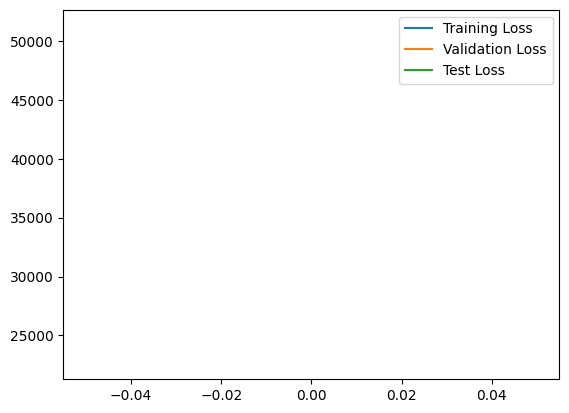

3059


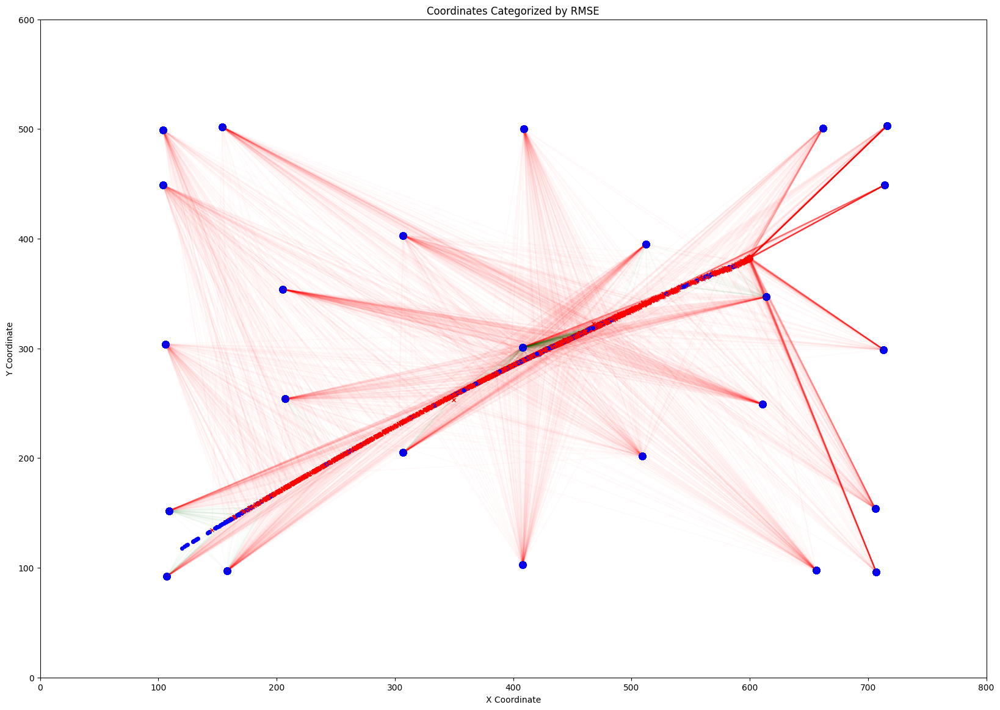

Epoch 1, batch 0 train Loss: 24753.138671875
Epoch 1, batch 100 train Loss: 21328.5546875
Epoch 1, batch 200 train Loss: 22376.9609375
Epoch 1, batch 300 train Loss: 16519.578125
Epoch 1, batch 400 train Loss: 22542.5859375
Epoch 1, Val Loss: 17406.461275540867 (best so far, saving..)
Epoch 1, Val Loss: 17406.461275540867
best validation loss: 17406.461275540867
Epoch 1, test Loss: 14692.760148326886
best test loss: 14692.760148326886


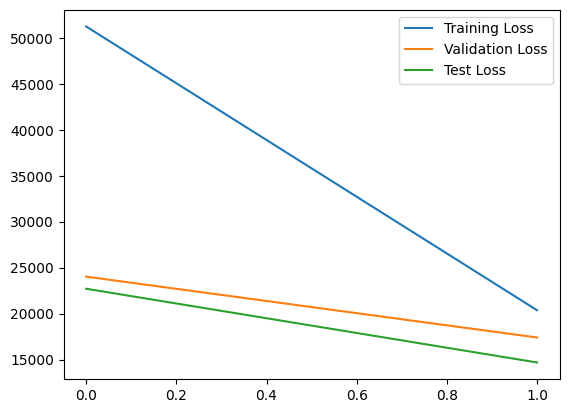

2844


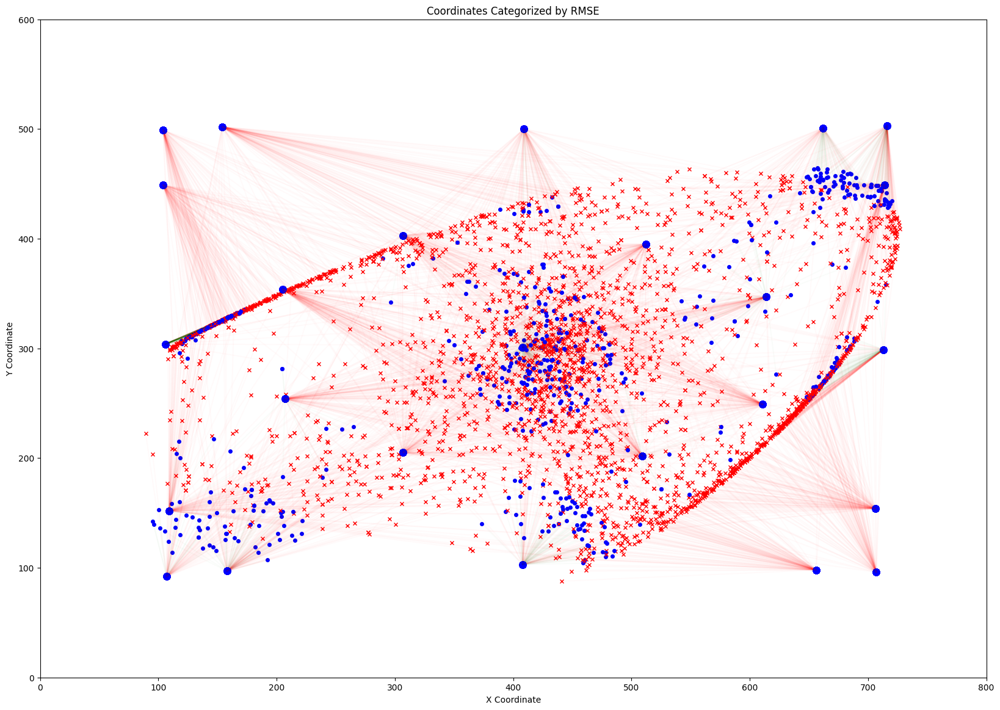

Epoch 2, batch 0 train Loss: 17411.166015625
Epoch 2, batch 100 train Loss: 13387.0390625
Epoch 2, batch 200 train Loss: 12554.75
Epoch 2, batch 300 train Loss: 13661.90234375
Epoch 2, batch 400 train Loss: 18103.138671875
Epoch 2, Val Loss: 16332.241455078125 (best so far, saving..)
Epoch 2, Val Loss: 16332.241455078125
best validation loss: 16332.241455078125
Epoch 2, test Loss: 13959.574420318217
best test loss: 13959.574420318217


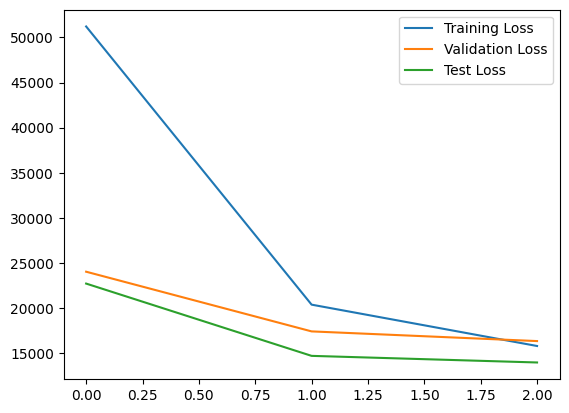

2661


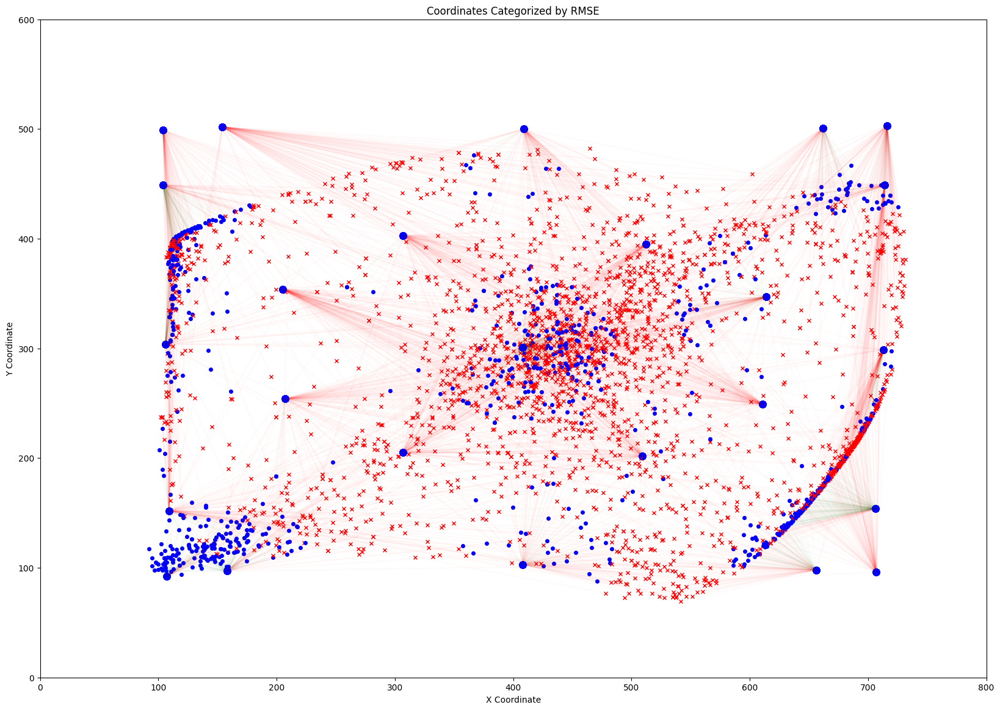

Epoch 3, batch 0 train Loss: 24941.892578125
Epoch 3, batch 100 train Loss: 18821.0390625
Epoch 3, batch 200 train Loss: 14922.501953125
Epoch 3, batch 300 train Loss: 18048.515625
Epoch 3, batch 400 train Loss: 12237.9521484375
Epoch 3, Val Loss: 14524.827261117789 (best so far, saving..)
Epoch 3, Val Loss: 14524.827261117789
best validation loss: 14524.827261117789
Epoch 3, test Loss: 12227.716758108729
best test loss: 12227.716758108729


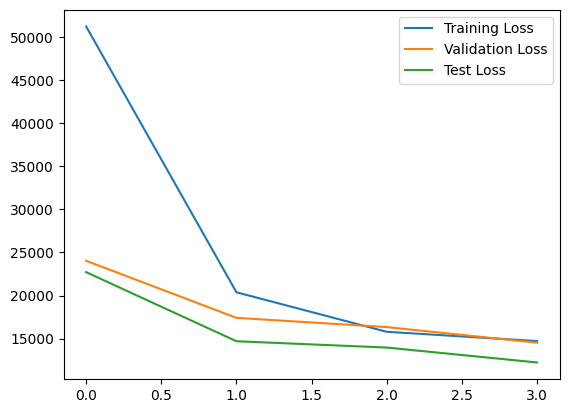

2305


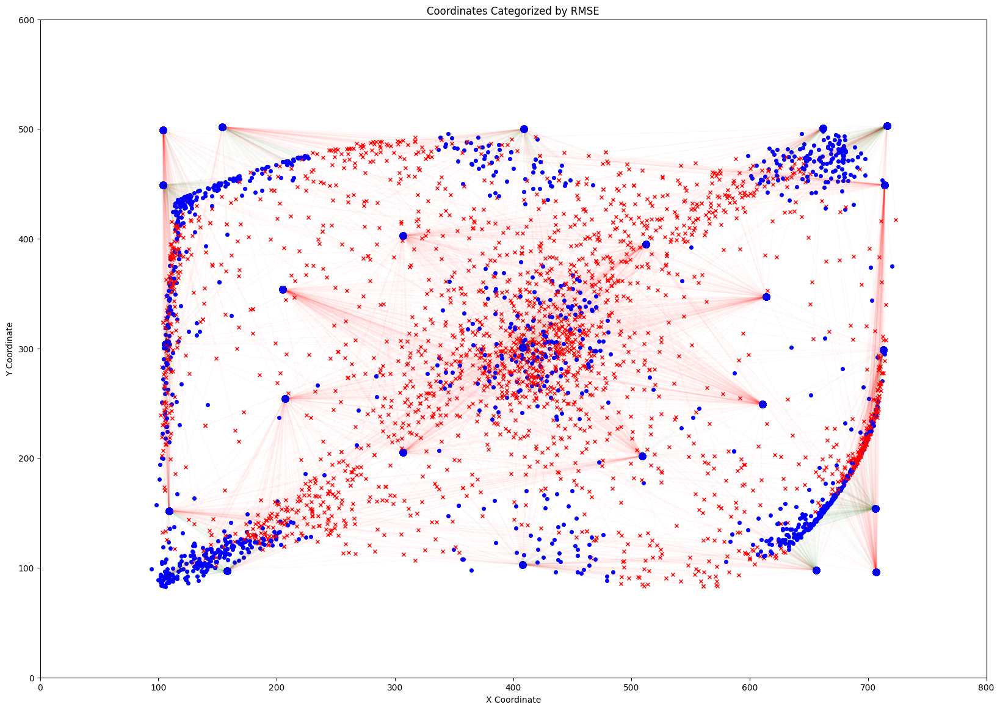

Epoch 4, batch 0 train Loss: 12552.1064453125
Epoch 4, batch 100 train Loss: 14031.6796875
Epoch 4, batch 200 train Loss: 13992.98828125
Epoch 4, batch 300 train Loss: 17860.056640625
Epoch 4, batch 400 train Loss: 13473.103515625
Epoch 4, Val Loss: 14846.650540865385
best validation loss: 14524.827261117789
Epoch 4, test Loss: 12004.958635342562
best test loss: 12004.958635342562


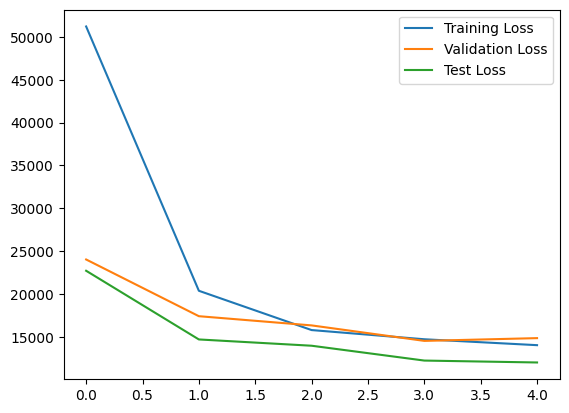

2389


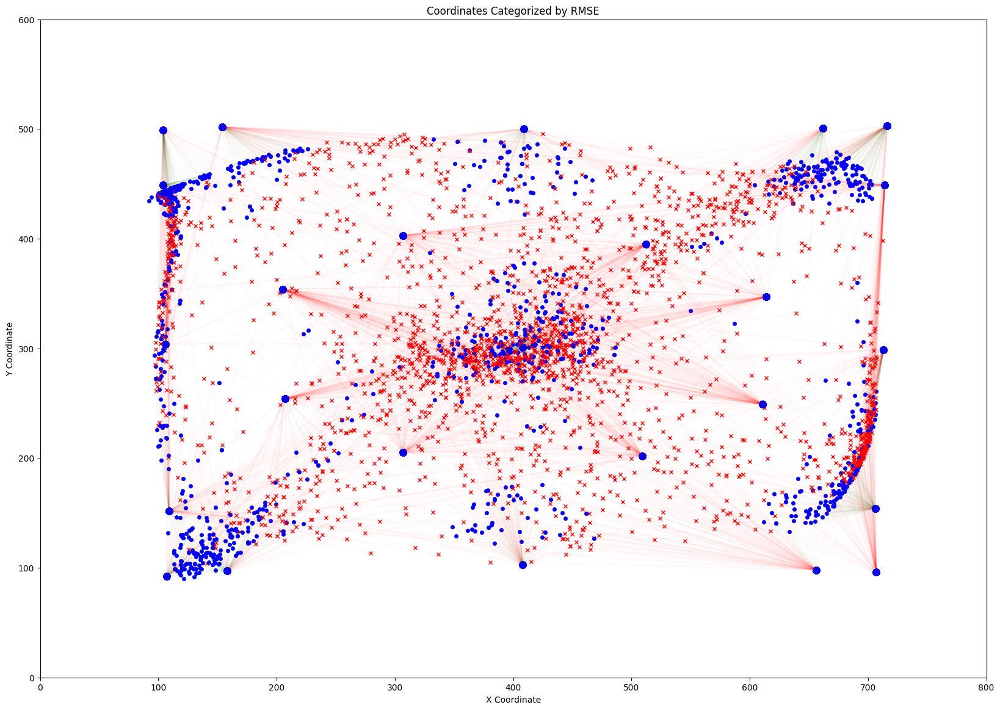

Epoch 5, batch 0 train Loss: 12887.798828125
Epoch 5, batch 100 train Loss: 12785.873046875
Epoch 5, batch 200 train Loss: 15306.0703125
Epoch 5, batch 300 train Loss: 17751.09375
Epoch 5, batch 400 train Loss: 15183.642578125
Epoch 5, Val Loss: 14786.56796499399
best validation loss: 14524.827261117789
Epoch 5, test Loss: 11683.80595074086
best test loss: 11683.80595074086


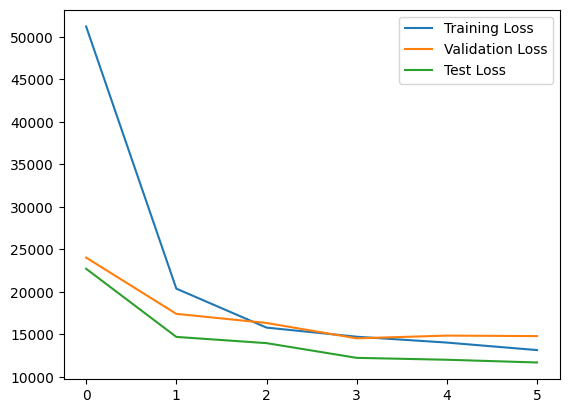

2166


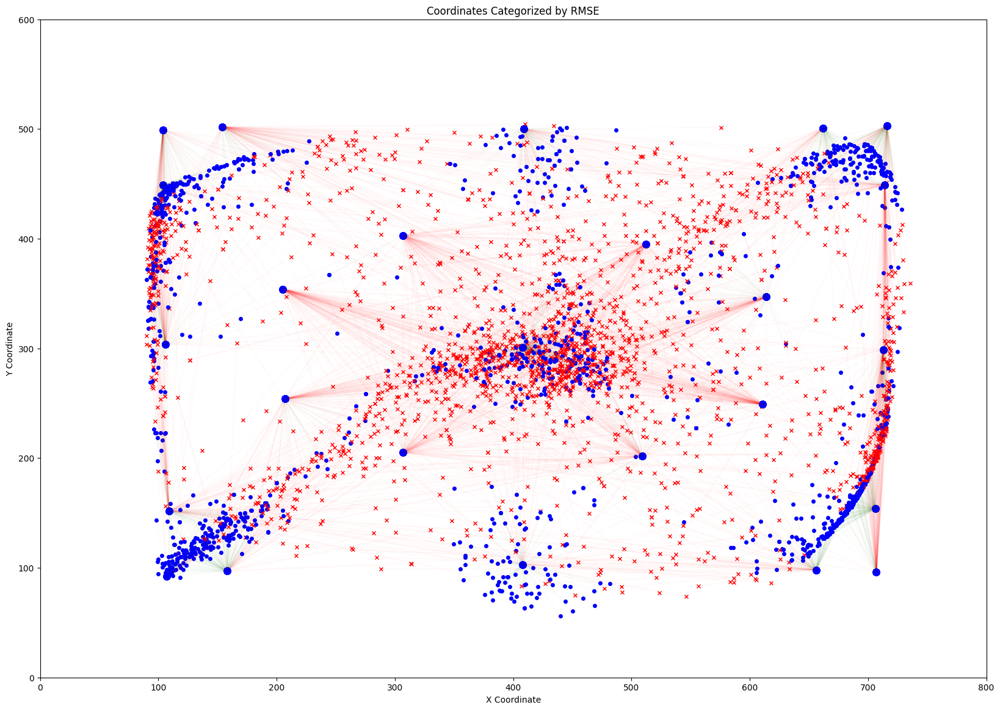

Epoch 6, batch 0 train Loss: 17640.93359375
Epoch 6, batch 100 train Loss: 10327.8974609375
Epoch 6, batch 200 train Loss: 8576.443359375
Epoch 6, batch 300 train Loss: 13678.1884765625
Epoch 6, batch 400 train Loss: 9677.6064453125
Epoch 6, Val Loss: 14008.923508864184 (best so far, saving..)
Epoch 6, Val Loss: 14008.923508864184
best validation loss: 14008.923508864184
Epoch 6, test Loss: 10933.330895062545
best test loss: 10933.330895062545


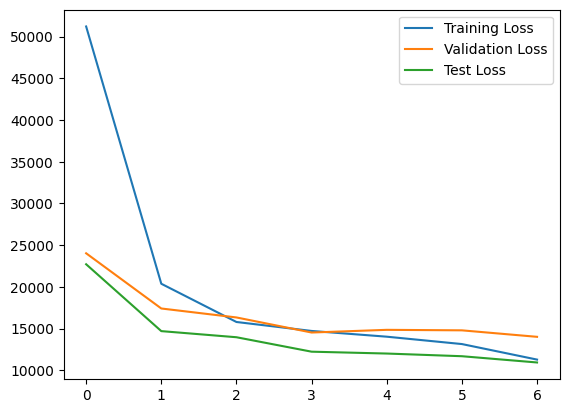

2027


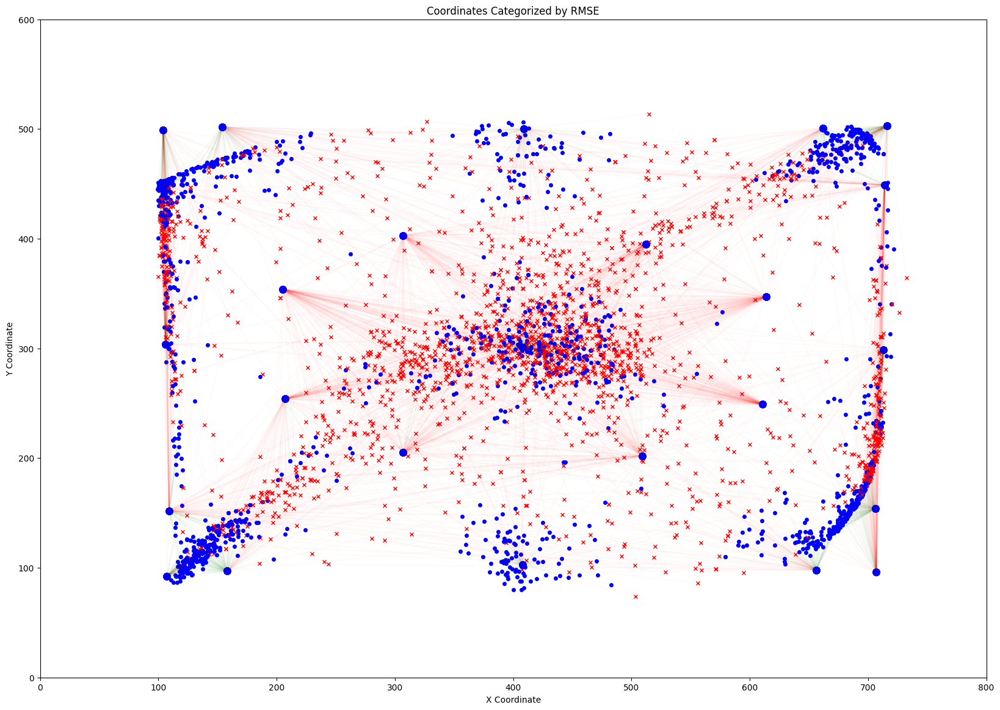

Epoch 7, batch 0 train Loss: 11206.0478515625
Epoch 7, batch 100 train Loss: 9616.3701171875
Epoch 7, batch 200 train Loss: 12088.6650390625
Epoch 7, batch 300 train Loss: 11279.8330078125
Epoch 7, batch 400 train Loss: 11765.115234375
Epoch 7, Val Loss: 14176.135375976562
best validation loss: 14008.923508864184
Epoch 7, test Loss: 11108.212510685646
best test loss: 10933.330895062545


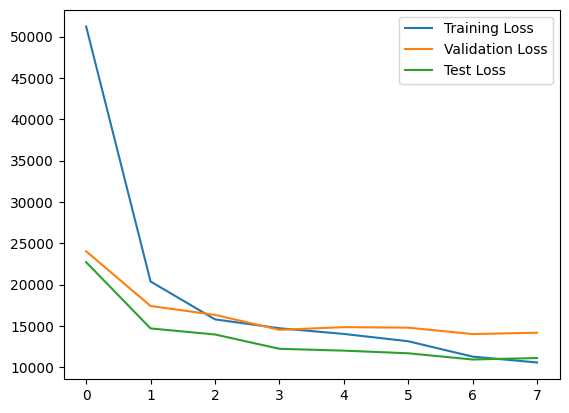

2006


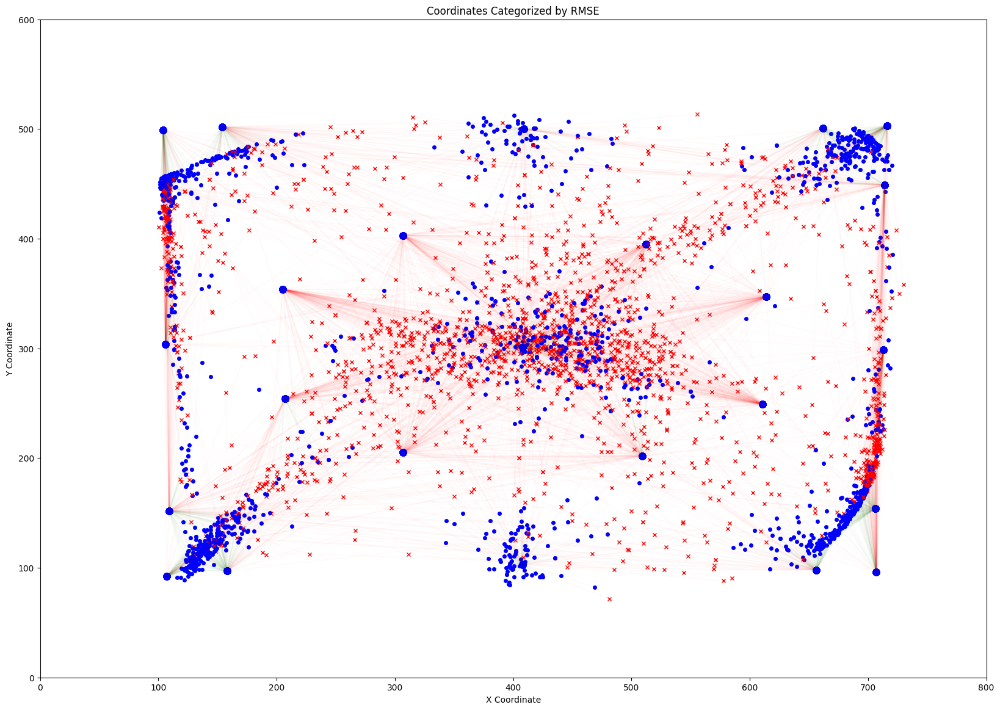

Epoch 8, batch 0 train Loss: 12419.990234375
Epoch 8, batch 100 train Loss: 8855.986328125
Epoch 8, batch 200 train Loss: 13484.23828125
Epoch 8, batch 300 train Loss: 8419.7421875
Epoch 8, batch 400 train Loss: 11169.5712890625
Epoch 8, Val Loss: 14247.326932466947
best validation loss: 14008.923508864184
Epoch 8, test Loss: 10938.038078075166
best test loss: 10933.330895062545


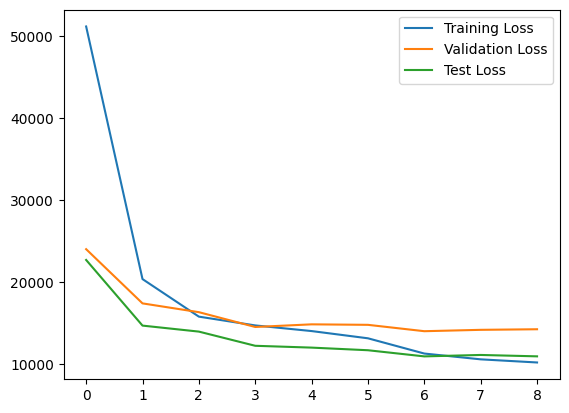

1945


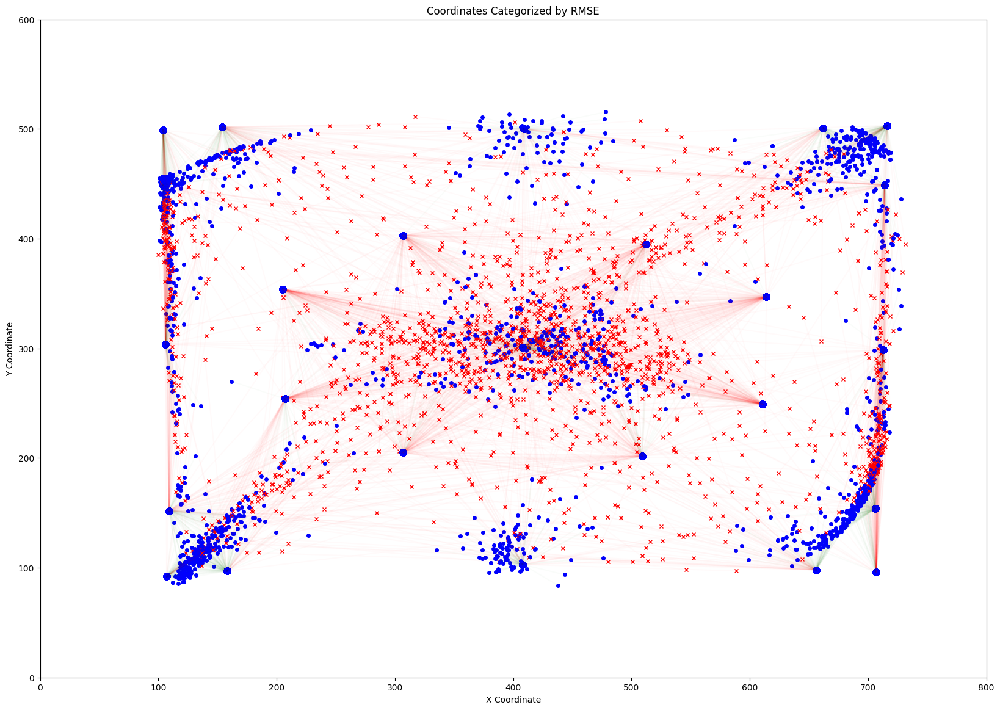

Epoch 9, batch 0 train Loss: 12044.4599609375
Epoch 9, batch 100 train Loss: 8536.5537109375
Epoch 9, batch 200 train Loss: 12757.529296875
Epoch 9, batch 300 train Loss: 10650.18359375
Epoch 9, batch 400 train Loss: 6034.650390625
Epoch 9, Val Loss: 14381.849769005408
best validation loss: 14008.923508864184
Epoch 9, test Loss: 11043.655641988242
best test loss: 10933.330895062545


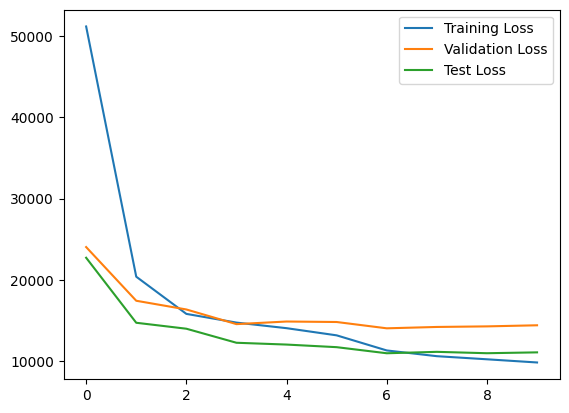

1944


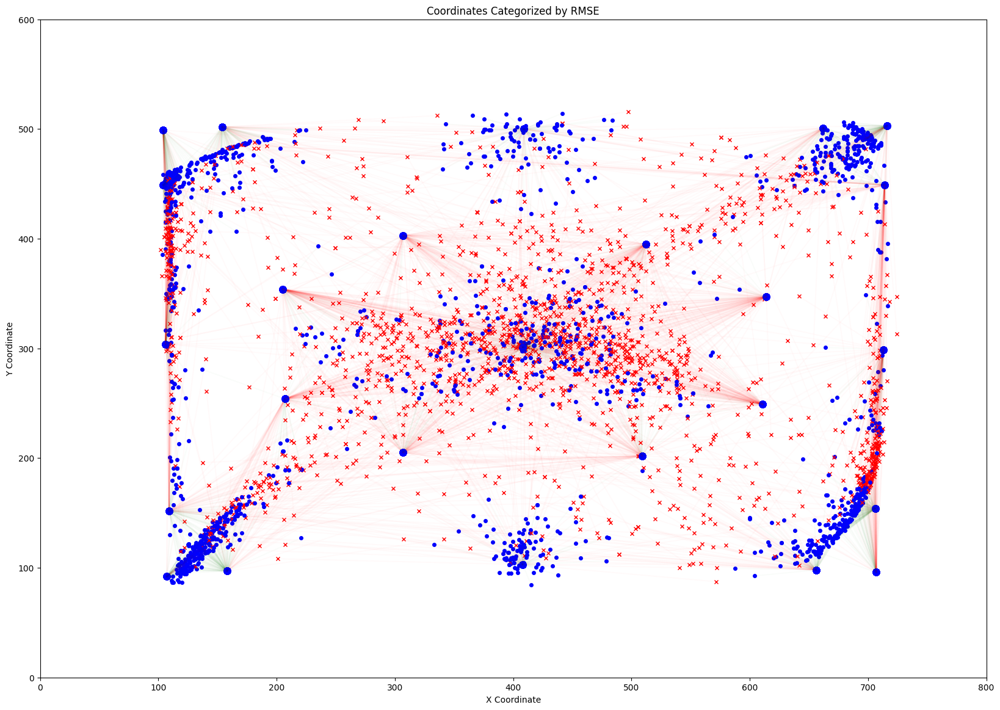

Epoch 10, batch 0 train Loss: 9464.8671875
Epoch 10, batch 100 train Loss: 11998.1171875
Epoch 10, batch 200 train Loss: 7030.62158203125
Epoch 10, batch 300 train Loss: 10659.078125
Epoch 10, batch 400 train Loss: 8087.43505859375
Epoch 10, Val Loss: 14698.918719951924
best validation loss: 14008.923508864184
Epoch 10, test Loss: 11758.155745814362
best test loss: 10933.330895062545


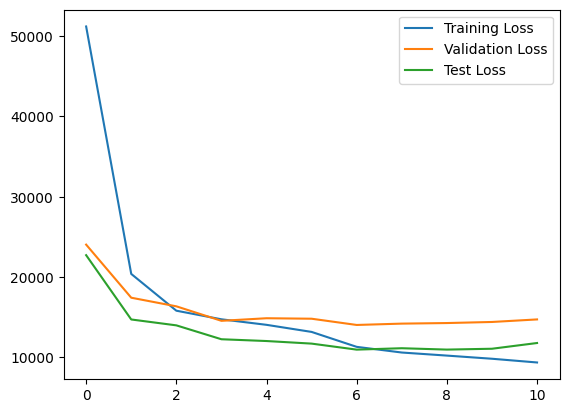

1976


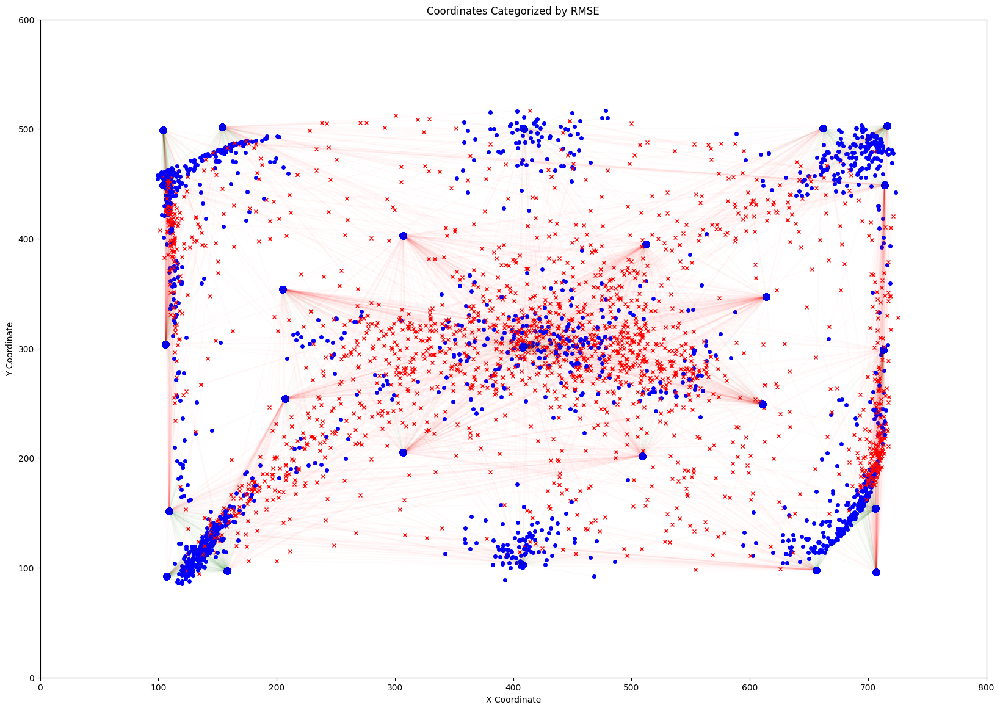

Epoch 11, batch 0 train Loss: 14356.2734375
Epoch 11, batch 100 train Loss: 8224.869140625
Epoch 11, batch 200 train Loss: 3990.071044921875
Epoch 11, batch 300 train Loss: 8186.71044921875
Epoch 11, batch 400 train Loss: 9075.33203125
Epoch 11, Val Loss: 14820.125
best validation loss: 14008.923508864184
Epoch 11, test Loss: 11485.576697051285
best test loss: 10933.330895062545


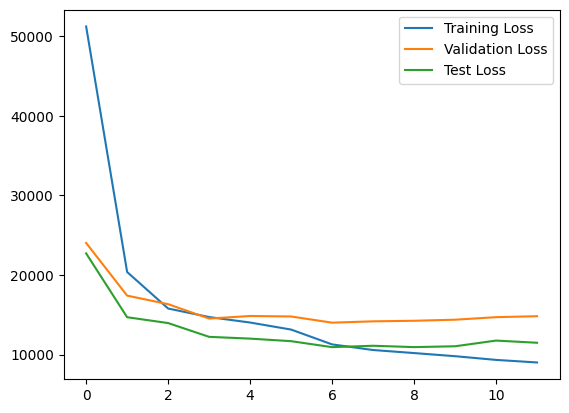

1898


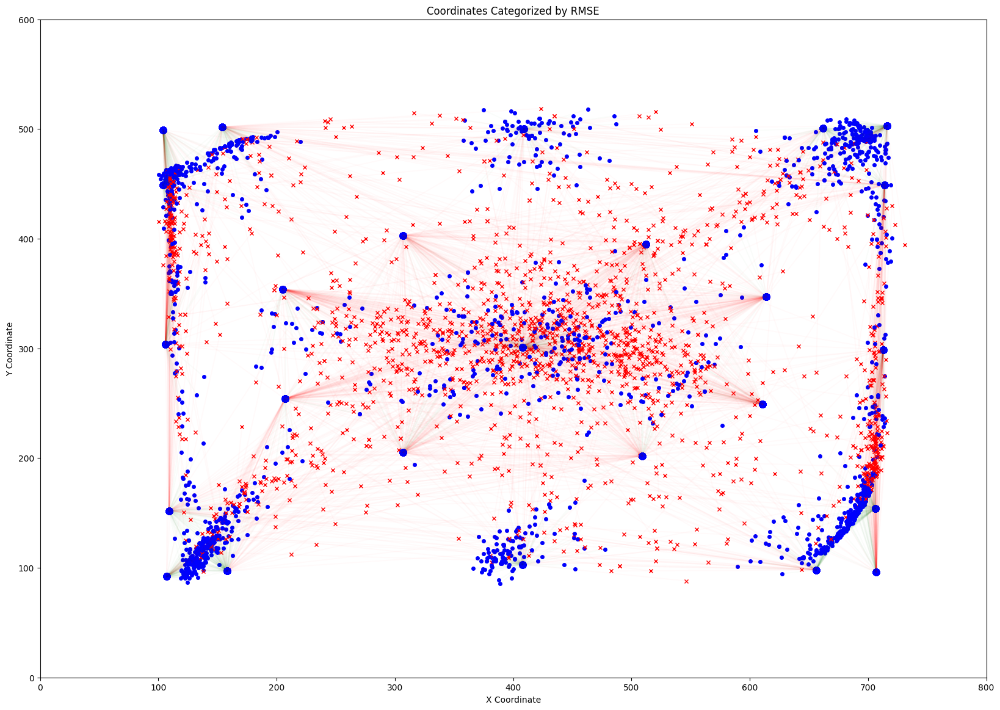

Epoch 12, batch 0 train Loss: 8134.130859375
Epoch 12, batch 100 train Loss: 10098.146484375
Epoch 12, batch 200 train Loss: 9232.564453125
Epoch 12, batch 300 train Loss: 5851.34033203125
Epoch 12, batch 400 train Loss: 6570.3837890625
Epoch 12, Val Loss: 14970.202702448918
best validation loss: 14008.923508864184
Epoch 12, test Loss: 11617.519365021695
best test loss: 10933.330895062545


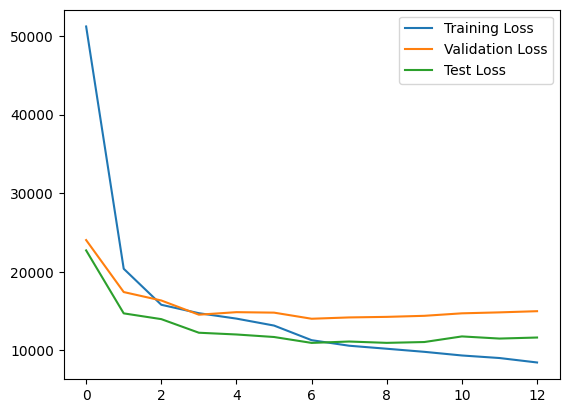

1906


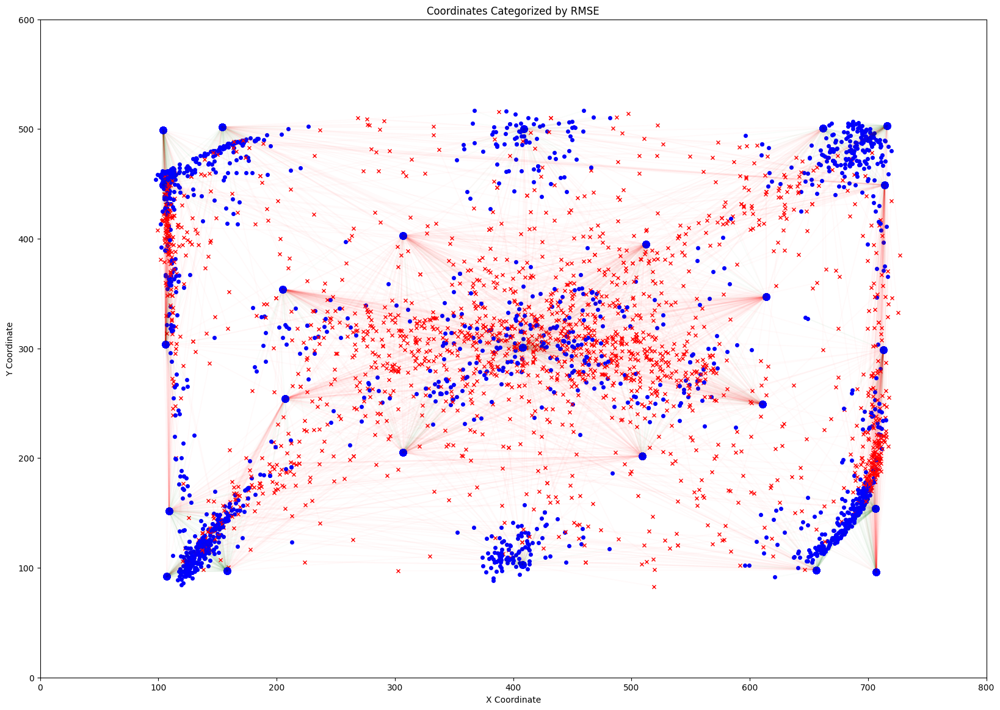

Epoch 13, batch 0 train Loss: 9888.701171875
Epoch 13, batch 100 train Loss: 6285.3916015625
Epoch 13, batch 200 train Loss: 13010.4453125
Epoch 13, batch 300 train Loss: 9075.4375
Epoch 13, batch 400 train Loss: 10334.8310546875
Epoch 13, Val Loss: 15285.097459059496
best validation loss: 14008.923508864184
Epoch 13, test Loss: 11868.421116369342
best test loss: 10933.330895062545


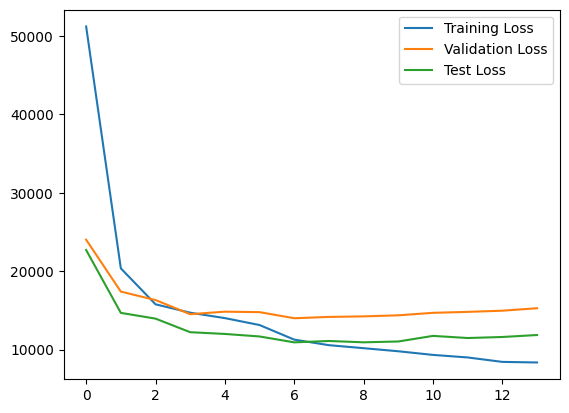

1944


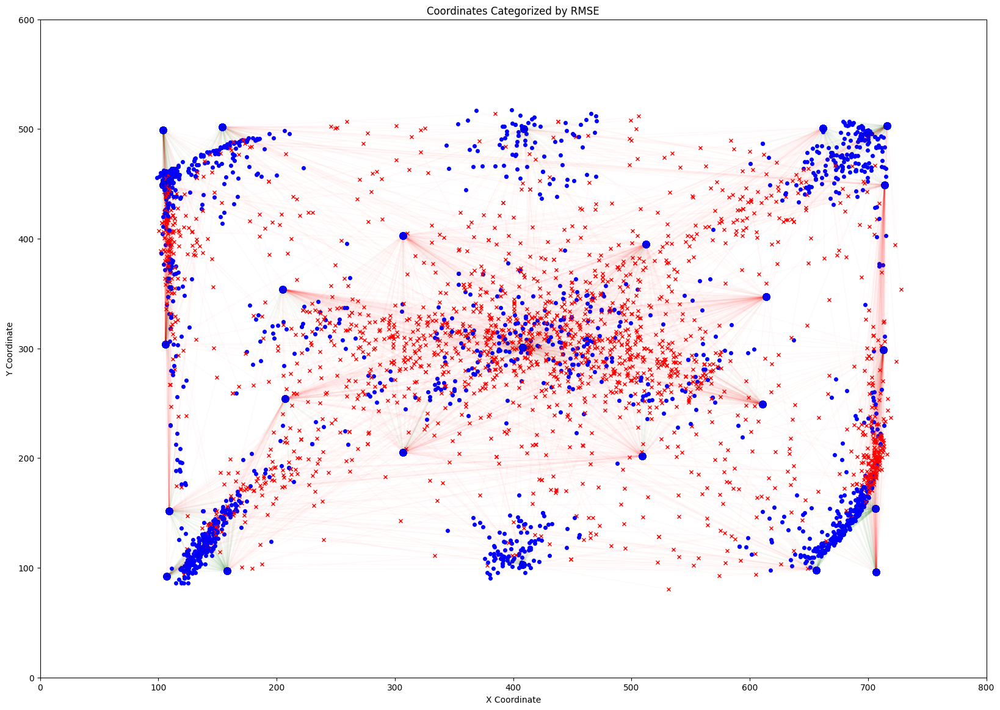

Epoch 14, batch 0 train Loss: 6470.978515625
Epoch 14, batch 100 train Loss: 6198.37158203125
Epoch 14, batch 200 train Loss: 15835.4140625
Epoch 14, batch 300 train Loss: 13271.361328125
Epoch 14, batch 400 train Loss: 6701.0380859375
Epoch 14, Val Loss: 15189.66522686298
best validation loss: 14008.923508864184
Epoch 14, test Loss: 11849.625580976557
best test loss: 10933.330895062545


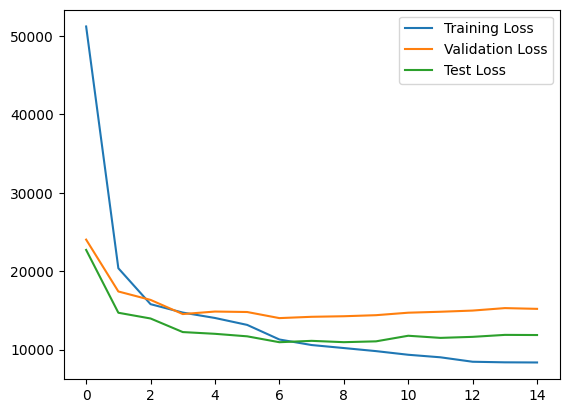

1924


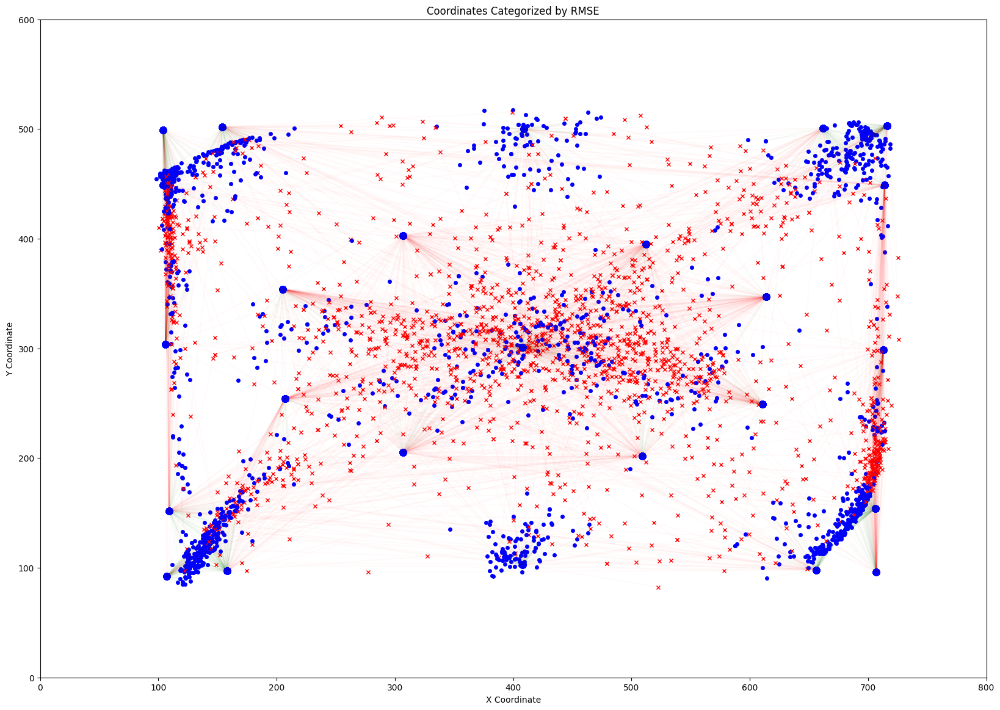

In [ ]:
train(model,optimizer=optimizer, scheduler=scheduler)

## Stop Runtime
stop runtime so it doesnt charge for more time

In [ ]:
#save model
torch.save(model.state_dict(), f'/content/drive/MyDrive/EEGViT_DATA/EEGLiT-best.pt')



In [ ]:
#stop runtime
from google.colab import runtime
runtime.unassign()


In [ ]:
#clear memory
# import gc
# model=None
# EEGEyeNet=None
# gc.collect()
# torch.cuda.empty_cache()

#Understanding Confidence

In [ ]:
import torch.nn.functional as F
import matplotlib.pyplot as plt

# Modify the model to return intermediate feature maps
class EEGViT_classifier_intermediate(EEGViT_classifier):
    def forward(self, x):
        x = self.conv1(x)
        intermediate = self.batchnorm1(x)
        x = self.ViT.forward(intermediate).logits
        return x, intermediate

# Load the modified model
loaded_model = EEGViT_classifier_intermediate().to(device)
state_dict = torch.load(model_path, map_location=device)
loaded_model.load_state_dict(state_dict)
loaded_model.eval()

# Forward pass the data and get the feature maps
def get_most_confident_predictions_for_label(data_loader, label=7):
    for data in data_loader:
        inputs, targets, _ = data
        inputs = inputs.to(device)
        outputs, intermediate = loaded_model(inputs)
        probabilities = F.softmax(outputs, dim=1)
        confidences, predicted_labels = torch.max(probabilities, 1)
        indices = (predicted_labels == label) & (confidences > 0.9)  # Adjust this threshold if needed
        if indices.sum() > 0:
            return inputs[indices].cpu(), intermediate[indices].cpu().detach().numpy()
    return None, None

# Using the loaded dataset
data_loader = DataLoader(EEGEyeNet, batch_size=batch_size, shuffle=False)
selected_inputs, selected_feature_maps = get_most_confident_predictions_for_label(data_loader)

# Visualize the feature maps
def visualize_feature_maps(feature_maps, num_maps=8):
    if feature_maps is None:
        print("No data was confidently predicted as label=7.")
        return

    # Assuming feature maps shape is [batch_size, num_channels, height, width]

    print(feature_maps.shape)
    return
    batch_size, num_channels, height, width = feature_maps.shape
    for i in range(min(num_maps, num_channels)):
        plt.figure(figsize=(10, 10))
        for j in range(batch_size):
            plt.subplot(batch_size, num_maps, j * num_maps + i + 1)
            plt.imshow(feature_maps[j, i], cmap='viridis')
            plt.axis('off')
        plt.show()

visualize_feature_maps(selected_feature_maps)


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized because the shapes did not match:
- vit.embeddings.patch_embeddings.projection.weight: found shape torch.Size([768, 3, 16, 16]) in the checkpoint and torch.Size([768, 64, 8, 1]) in the model instantiated
- vit.embeddings.position_embeddings: found shape torch.Size([1, 197, 768]) in the checkpoint and torch.Size([1, 225, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


NameError: ignored

#Understanding Convolutional Layers
Trying to understand/visualize the convolutional layers in the model

In [ ]:

# from google.colab import data_table
# import pandas as pd
# data_table.enable_dataframe_formatter()

# #model = EEGViT_pretrained()

# model_name = f'/content/drive/MyDrive/EEGViT_DATA/{dataset_name}-33.pt'
# model.load_state_dict(torch.load(model_name))

# model.eval()


In [ ]:
# def get_interested_layer_output(module, input, output):
#     # Store the output in a global variable or pass it to your desired data structure
#     global intermediate_output
#     intermediate_output = output

# import torch.nn as nn

# hook_handle = model.conv1.register_forward_hook(get_interested_layer_output)


In [ ]:
# import os
# saved_eyenet = f"/content/drive/MyDrive/EEGViT_DATA/{dataset_name}.pth"

# if os.path.exists(saved_eyenet):
#   EEGEyeNet = torch.load(saved_eyenet)
# else:
#   EEGEyeNet = EEGEyeNetDataset(f'/content/drive/MyDrive/EEGViT_DATA/{dataset_name}.npz')
#   # Save the object
#   torch.save(EEGEyeNet, saved_eyenet)

In [ ]:
  # df = EEGEyeNet.trainY

  # df = df[(df >= 0).all(axis=1)]
  # EEGEyeNet.trainY = df

#Understanding Test Error

In [ ]:
import torch
import torch.nn as nn
from sklearn.metrics import mean_squared_error
from math import sqrt
from torch.utils.data import DataLoader, TensorDataset, Subset


# Determine the size for the test dataset (last 15%)
test_size = int(0.15 * len(EEGEyeNet))

# Split the dataset into training and test datasets
test_dataset = Subset(EEGEyeNet,indices=EEGEyeNet.trainY.index[-test_size:])

# Define a data loader for the test dataset
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

# Initialize the model
model.eval()
#device = torch.device("cpu")

gpu_id = 0  # Change this to the desired GPU ID if you have multiple GPUs
torch.cuda.set_device(gpu_id)
device = torch.device(f"cuda:{gpu_id}")
criterion = nn.MSELoss()
criterion = criterion.to(device)

model.to(device)

test_loss =0
output_and_rmse = []

with torch.no_grad():
    for item in test_loader:
        inputs, targets, index = item

        targets = targets.to(device)
        inputs = inputs.to(device)

        predictions = model(inputs)

        x,y = predictions.tolist()[0]
        a,b = targets.tolist()[0]

        loss = criterion(predictions.squeeze(), targets.squeeze())
        test_loss += loss.item()

        t = targets.to(torch.device("cpu"))
        p = predictions.to(torch.device("cpu"))


        rmse = sqrt(mean_squared_error(t, p))

        output_and_rmse.append([a,b,x,y, rmse])



output_and_rmse
print(f"Test loss: {test_loss / len(test_loader)}")



In [ ]:
import matplotlib.pyplot as plt


# Usage example:
# Replace output_and_rmse_list with your list and threshold with your desired threshold value.

plot_coordinates_with_threshold(output_and_rmse, 180)


# Understanding Least Confident Predictions

In [ ]:
import torch
from torch.utils.data import DataLoader, Subset
import matplotlib.pyplot as plt

# Assuming necessary imports and functions are already present (from your previous code snippets)

def get_confidences_and_rmse(model, test_loader, num_runs=10):
    model.train()  # Enable dropout during evaluation
    data_points = []

    with torch.no_grad():
        for inputs, targets, index in test_loader:
            inputs = inputs.to(device)
            targets = targets.to(device)

            multiple_outputs = [model(inputs) for _ in range(num_runs)]
            variances = torch.var(torch.stack(multiple_outputs), dim=0)

            # Using the mean variance across outputs as a measure of confidence
            mean_variance = variances.mean().item()

            # Store the original prediction (mean of the outputs), its confidence, and RMSE
            mean_output = torch.mean(torch.stack(multiple_outputs), dim=0)
            x, y = mean_output.tolist()[0]
            a, b = targets.tolist()[0]
            rmse = ((a - x)**2 + (b - y)**2)**0.5
            data_points.append([a, b, x, y, rmse, mean_variance])

    # Sorting by confidence (in this case mean_variance), so least confident will be at the top
    data_points.sort(key=lambda x: x[5], reverse=True)
    return data_points

# Load the test dataset
train_indices, val_indices, test_indices = split(EEGEyeNet.trainY.index)
test = Subset(EEGEyeNet, indices=test_indices)
test_loader = DataLoader(test, batch_size=1)

# Load the model
model_path = "/content/drive/MyDrive/EEGViT_DATA/Position_task_with_dots_synchronised_min-32.pt"
model = EEGViT_pretrained(dropout=0.3)  # Assuming the EEGViT_pretrained class is defined
model.load_state_dict(torch.load(model_path))

# If GPU is available
if torch.cuda.is_available():
    gpu_id = 0
    torch.cuda.set_device(gpu_id)
    device = torch.device(f"cuda:{gpu_id}")
else:
    device = torch.device("cpu")

model = model.to(device)

# Get the least confident test data points based on mean_variance
data_points = get_confidences_and_rmse(model, test_loader)

# Prepare the data in the format expected by plot_coordinates_with_threshold
plot_data = [[a, b, x, y, rmse] for a, b, x, y, rmse, _ in data_points[:200]]

# Plot the least confident points based on RMSE using the provided function
plot_coordinates_with_threshold(plot_data, plot_threshold)


In [ ]:
#stop runtime
from google.colab import runtime
runtime.unassign()

#Understanding Window Smoothing

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np  # Assuming your dataset is in numpy format

windowsize = 15

def process_dataset(dataset):
    # Assuming dataset shape is (21464, 1, 129, 500)
    processed_data = np.zeros_like(dataset)  # To store processed data

    for i in range(dataset.shape[0]):
        d = pd.DataFrame(dataset[i][0].T)  # Transpose the DataFrame to (500, 129)
        rolled_d = d.apply(lambda row: row.rolling(window=windowsize, center=False).mean(), axis=1)

        # Convert rolled_d back to numpy and store in processed_data
        processed_data[i][0] = rolled_d.T.to_numpy()

    return processed_data

# Assuming EEGEyeNet.trainX is a numpy array with shape (21464, 1, 129, 500)
EEGEyeNet_processed = process_dataset(EEGEyeNet.trainX)
